In [15]:
%matplotlib ipympl

import sys
import os
sys.path.append("../src/")
import matplotlib.pyplot as plt

import importlib
import cdsaxs
import cdsaxs.loaders
import cdsaxs.loaders.load_data as loaders
import cdsaxs.plotting
import numpy as np

# if you are not actively developing the code, you can comment the rest of these out
importlib.reload(cdsaxs)
importlib.reload(cdsaxs.tools)
importlib.reload(cdsaxs.calculators)
importlib.reload(cdsaxs.data.data1d)
importlib.reload(cdsaxs.data.data2d)
importlib.reload(cdsaxs.data.dataset)
importlib.reload(cdsaxs.loaders)
importlib.reload(cdsaxs.data.metadata)
importlib.reload(cdsaxs.plotting)
importlib.reload(cdsaxs.plotting.plotting)
importlib.reload(cdsaxs.plotting._plotting_tools)
# importlib.reload(cdsaxs.plotting._plotly_tools)
importlib.reload(cdsaxs.reduction)
importlib.reload(cdsaxs.data.data2d)

from cdsaxs.plotting import _plotly_tools as plotly_tools
from cdsaxs.plotting import _plotting_tools as plotting_tools
from cdsaxs.plotting import plotting as cdsaxs_plotting

# cvs_path = os.path.abspath("data_W204_F2/W204_metadata.csv")
# dataset = loaders.LoadDataset_MetadataCSV("test", metadata_csv_filepath=cvs_path, data_name_pattern="{sample_phi_deg}", detector_type='pilatus')
# dataset.update_all_metadata({'center_px': (740, 490), 'sample_phi_offset_deg': -2})

# data = dataset.datas["0.0"]

## Loading Data

In [16]:
from cdsaxs.loaders import load_data
data_dir = "data_W204_F2/"
filenames = load_data.filter_filenames(data_dir, filter_substrings=[['W204','0deg']], file_extension='tif')
filenames

['W204_F2measure1_5.2m_16.1keV_num30_-30deg_bpm0.416_id857151_combined.tif',
 'W204_F2measure1_5.2m_16.1keV_num50_-10deg_bpm0.421_id857171_combined.tif',
 'W204_F2measure1_5.2m_16.1keV_num80_20deg_bpm0.415_id857201_combined.tif',
 'W204_F2measure1_5.2m_16.1keV_num20_-40deg_bpm0.411_id857141_combined.tif',
 'W204_F2measure1_5.2m_16.1keV_num120_60deg_bpm0.416_id857241_combined.tif',
 'W204_F2measure1_5.2m_16.1keV_num40_-20deg_bpm0.418_id857161_combined.tif',
 'W204_F2measure1_5.2m_16.1keV_num100_40deg_bpm0.419_id857221_combined.tif',
 'W204_F2measure1_5.2m_16.1keV_num60_00deg_bpm0.417_id857181_combined.tif',
 'W204_F2measure1_5.2m_16.1keV_num10_-50deg_bpm0.404_id857131_combined.tif',
 'W204_F2measure1_5.2m_16.1keV_num70_10deg_bpm0.414_id857191_combined.tif',
 'W204_F2measure1_5.2m_16.1keV_num110_50deg_bpm0.418_id857231_combined.tif',
 'W204_F2measure1_5.2m_16.1keV_num00_-60deg_bpm0.415_id857121_combined.tif',
 'W204_F2measure1_5.2m_16.1keV_num90_30deg_bpm0.414_id857211_combined.tif']

In [17]:
data = load_data.LoadData("data_W204_F2/W204_F2measure1_5.2m_16.1keV_num60_00deg_bpm0.417_id857181_combined.tif", # path to single file to load as Data2D
                          metadata={'sdd_cm': 500, 'energy_ev': 16100, 'exposure_time_s': 2, 'sample_phi_deg': 0}, # optional, assign metadata
                          user_params={'sample_name': 'W204 F2'}, # optional, assign user parameters
                          name='test data2d', # optional, name for the Data2D instance
                          filetype='tif', # optional, set the filetype to help the loader pick the right function to read the file, otherwise it will try to figure it out based on the file extension
                          detector_type='pilatus') # optional, it will try to extract count time and pixel size from the pilatus header, assuming 172 um pixel size if that fails

C:\Users\cmw5\Documents\github_repos\nist_cdsaxs\validation\../src\cdsaxs\loaders\_loader_tools.py:44: UserWarning:

Count not extract count time from file; returning None.

C:\Users\cmw5\Documents\github_repos\nist_cdsaxs\validation\../src\cdsaxs\loaders\_loader_tools.py:75: UserWarning:

Could not extract pixel size from the header; returning None

C:\Users\cmw5\Documents\github_repos\nist_cdsaxs\validation\../src\cdsaxs\loaders\_loader_tools.py:111: UserWarning:

Assuming a pixel size of 172 micron for Pilatus.Please confirm this is correct before proceeding.

C:\Users\cmw5\Documents\github_repos\nist_cdsaxs\validation\../src\cdsaxs\data\data2d.py:268: UserWarning:

The following metadta is missing to calculate q: ['center_px']



In [18]:
type(data)

cdsaxs.data.data2d.Data2D

In [19]:
dataset = load_data.LoadDataset(
    'test_dataset', # the dataset name is required
    data_dir, # directory where the data is located
    # filenames=filenames, # optional, list of filenames to load if you want to filter the data directory
    metadata_pattern="W204_F2measure1_{sdd_cm}m_{energy_ev}keV_num{num}_{sample_phi_deg}deg_bpm{bpm}_id{id}_combined.tif", # optional, filename pattern to extract metadata from the filenames
    metadata_scales={'sdd_cm': 100, 'energy_ev': 1000}, # optional, scales these metadata if they were in the filename with incorrect unnits
    data_name_pattern='W204 F2 at {sample_phi_deg} deg', # optional, pattern to follow for the data keys (each detector image in the dataset, will need to be unique), default is the filename
    metadata={'exposure_time_s': 2}, # optional, any extra metadata that applies to all data
    user_params={'sample_name': 'W204 F2'}, # optional, any unique user parameters that applies to all data
    verbose=True, # optional, will provide a status bar while files are loaded
    filetype='tif', # optional, specify the filetype, this will help filter the files if they have not been filtered already, if not provided the laoder will try to guess based on the file extension
    detector_type='pilatus'# optional, will try to extract count time and pixel size from the pilatus header, if this isn't possible it will assume 172 um as the pixel size
)

Loading files: 100%|█████████████████████████| 121/121 [00:04<00:00, 25.56it/s]

Count not extract count time from file; returning None.
Could not extract pixel size from the header; returning None
Assuming a pixel size of 172 micron for Pilatus.Please confirm this is correct before proceeding.
The following metadta is missing to calculate q: ['center_px']
Created dataset from data directory: C:\Users\cmw5\Documents\github_repos\nist_cdsaxs\validation\data_W204_F2


In [20]:
type(dataset)

cdsaxs.data.dataset.Dataset

In [21]:
list(dataset.datas.keys())

['W204 F2 at -60.0 deg',
 'W204 F2 at -59.0 deg',
 'W204 F2 at -58.0 deg',
 'W204 F2 at -57.0 deg',
 'W204 F2 at -56.0 deg',
 'W204 F2 at -55.0 deg',
 'W204 F2 at -54.0 deg',
 'W204 F2 at -53.0 deg',
 'W204 F2 at -52.0 deg',
 'W204 F2 at -51.0 deg',
 'W204 F2 at 40.0 deg',
 'W204 F2 at 41.0 deg',
 'W204 F2 at 42.0 deg',
 'W204 F2 at 43.0 deg',
 'W204 F2 at 44.0 deg',
 'W204 F2 at 45.0 deg',
 'W204 F2 at 46.0 deg',
 'W204 F2 at 47.0 deg',
 'W204 F2 at 48.0 deg',
 'W204 F2 at 49.0 deg',
 'W204 F2 at -50.0 deg',
 'W204 F2 at 50.0 deg',
 'W204 F2 at 51.0 deg',
 'W204 F2 at 52.0 deg',
 'W204 F2 at 53.0 deg',
 'W204 F2 at 54.0 deg',
 'W204 F2 at 55.0 deg',
 'W204 F2 at 56.0 deg',
 'W204 F2 at 57.0 deg',
 'W204 F2 at 58.0 deg',
 'W204 F2 at 59.0 deg',
 'W204 F2 at -49.0 deg',
 'W204 F2 at 60.0 deg',
 'W204 F2 at -48.0 deg',
 'W204 F2 at -47.0 deg',
 'W204 F2 at -46.0 deg',
 'W204 F2 at -45.0 deg',
 'W204 F2 at -44.0 deg',
 'W204 F2 at -43.0 deg',
 'W204 F2 at -42.0 deg',
 'W204 F2 at -41.0 de

In [22]:
dataset_csv = load_data.LoadDataset_MetadataCSV(
    "test dataset csv",
    metadata_csv_filepath="data_W204_F2/W204_metadata.csv",
    verbose=True,
    filetype='tif',
    detector_type='pilatus',
    data_name_pattern='W204 F2 at {sample_phi_deg} deg'
)

Loading files: 100%|█████████████████████████| 121/121 [00:05<00:00, 20.69it/s]

Count not extract count time from file; returning None.
Could not extract pixel size from the header; returning None
Assuming a pixel size of 172 micron for Pilatus.Please confirm this is correct before proceeding.
The following metadta is missing to calculate q: ['center_px']
Created dataset from data directory: C:\Users\cmw5\Documents\github_repos\nist_cdsaxs\validation\data_W204_F2
and csv file W204_metadata.csv.


In [23]:
type(dataset_csv)

cdsaxs.data.dataset.Dataset

In [24]:
list(dataset_csv.datas.keys())

['W204 F2 at -60.0 deg',
 'W204 F2 at -59.0 deg',
 'W204 F2 at -58.0 deg',
 'W204 F2 at -57.0 deg',
 'W204 F2 at -56.0 deg',
 'W204 F2 at -55.0 deg',
 'W204 F2 at -54.0 deg',
 'W204 F2 at -53.0 deg',
 'W204 F2 at -52.0 deg',
 'W204 F2 at -51.0 deg',
 'W204 F2 at -50.0 deg',
 'W204 F2 at -49.0 deg',
 'W204 F2 at -48.0 deg',
 'W204 F2 at -47.0 deg',
 'W204 F2 at -46.0 deg',
 'W204 F2 at -45.0 deg',
 'W204 F2 at -44.0 deg',
 'W204 F2 at -43.0 deg',
 'W204 F2 at -42.0 deg',
 'W204 F2 at -41.0 deg',
 'W204 F2 at -40.0 deg',
 'W204 F2 at -39.0 deg',
 'W204 F2 at -38.0 deg',
 'W204 F2 at -37.0 deg',
 'W204 F2 at -36.0 deg',
 'W204 F2 at -35.0 deg',
 'W204 F2 at -34.0 deg',
 'W204 F2 at -33.0 deg',
 'W204 F2 at -32.0 deg',
 'W204 F2 at -31.0 deg',
 'W204 F2 at -30.0 deg',
 'W204 F2 at -29.0 deg',
 'W204 F2 at -28.0 deg',
 'W204 F2 at -27.0 deg',
 'W204 F2 at -26.0 deg',
 'W204 F2 at -25.0 deg',
 'W204 F2 at -24.0 deg',
 'W204 F2 at -23.0 deg',
 'W204 F2 at -22.0 deg',
 'W204 F2 at -21.0 deg',


## Data2D

In [25]:
data.metadata

{'sdd_cm': 500,
 'energy_ev': 16100,
 'wavelength_nm': 0.07700882268401864,
 'exposure_time_s': 2,
 'sample_phi_deg': 0,
 'pixel_size_um': 172,
 'data_directory': 'C:\\Users\\cmw5\\Documents\\github_repos\\nist_cdsaxs\\validation\\data_W204_F2',
 'filename': 'W204_F2measure1_5.2m_16.1keV_num60_00deg_bpm0.417_id857181_combined.tif',
 'sample_phi_offset_deg': 0,
 'center_px': (0, 0)}

In [26]:
data.update_metadata(metadata={'exposure_time_s': 3}, overwrite=True)
data.metadata

{'sdd_cm': 500,
 'energy_ev': 16100,
 'wavelength_nm': 0.07700882268401864,
 'exposure_time_s': 3,
 'sample_phi_deg': 0,
 'pixel_size_um': 172,
 'data_directory': 'C:\\Users\\cmw5\\Documents\\github_repos\\nist_cdsaxs\\validation\\data_W204_F2',
 'filename': 'W204_F2measure1_5.2m_16.1keV_num60_00deg_bpm0.417_id857181_combined.tif',
 'sample_phi_offset_deg': 0,
 'center_px': (0, 0)}

In [27]:
data.user_params

{'sample_name': 'W204 F2'}

In [28]:
data.update_user_params(params={'sample_name': 'W204 F2 0 degrees'}, overwrite=True)
data.user_params

{'sample_name': 'W204 F2 0 degrees'}

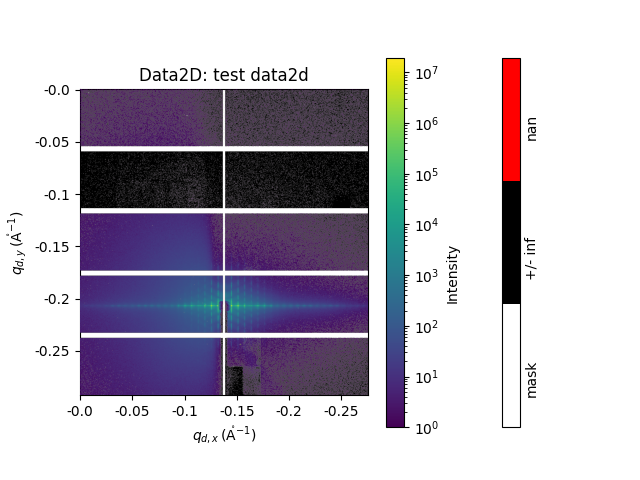

In [29]:
# note that the mask should be default mask out any points that are inf, -inf, or nan when the data is loaded unless this is overwritten by the user
# any of the standard colors accepted by matplotlib can be used to designate the color for any masked or inf/nan points
# 'transparent' can also be used as an accepted keyword for any of the masked regions

fig = data.plot_data(
    log_scale=True,
    cmap='viridis', # optional, switch to any accepted colormap in matplotlib
    aspect='equal', # optional, 'equal' will keep square pixels while 'auto' will reshape the detector image to fit the figure size
    vmin=None, # optional, set the colorbar range min, noting that vmin of 0 will not be valid for a log-scale plot
    vmax=None, # optional, set the colorbar range max, 
    color_mask='transparent', # optional, default is transparent, any points that are part of the existing mask
    color_inf='black', # optional, default is black, any -inf/inf points not in the mask and also any intensities less than or equal to 0 are shown as this color
    color_nan='red' # optional, default is red, any nan points not in the mask and also any intensities less than or equal to 0 are show as this color
)

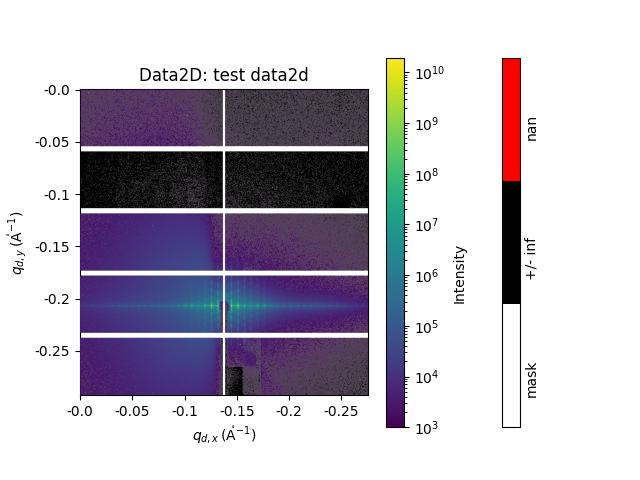

In [30]:
data.scale_data(1000) # normalize, add_to and subtract_from are available options
fig = data.plot_data()

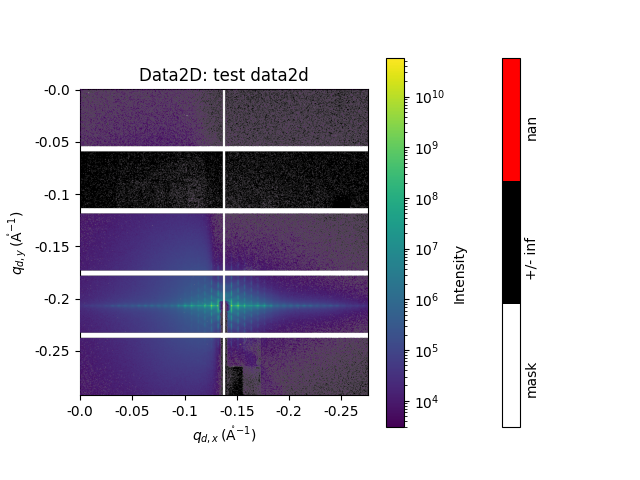

In [31]:
data.scale_by_metadata('exposure_time_s') # you can also normalize by any metadata or user_params
fig = data.plot_data()

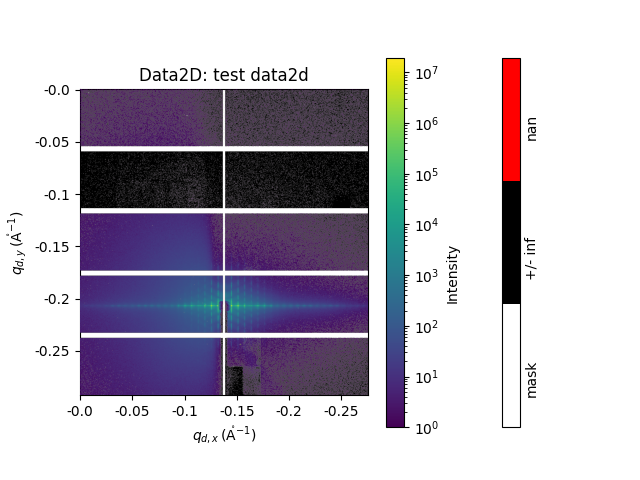

In [32]:
data.reset_intensity() # resets any normalization, scaling, adding, or subtracting that has been applied
fig = data.plot_data()

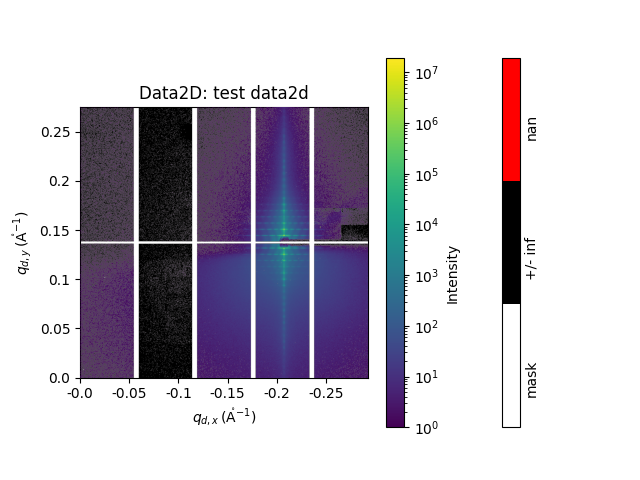

In [33]:
data.rotate_image_ccw(1) # rotate the image by 90 degree steps counter clockwise (this is actually clockwise about the positive z axis)
fig = data.plot_data()

In [34]:
# good to close plots occasionally for memory purposes
plt.close('all')

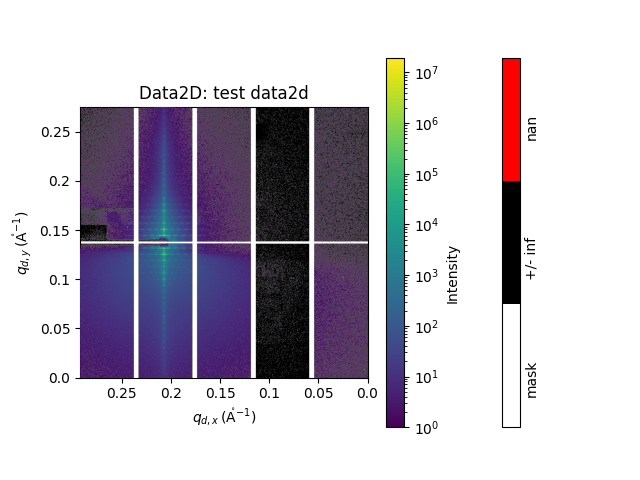

In [35]:
data.flip_horizontally()
fig = data.plot_data()

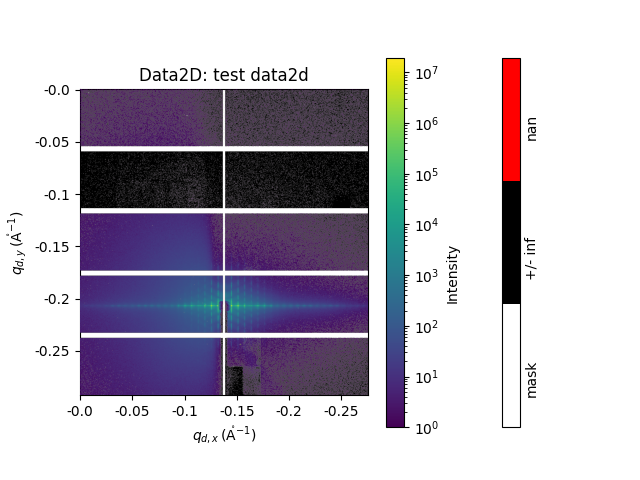

In [36]:
data.reset_image() # resets any rotations AND normalize/scale/add/subtract! will also reset the beam center to (0, 0) so be careful when working this into your workflow
fig = data.plot_data()

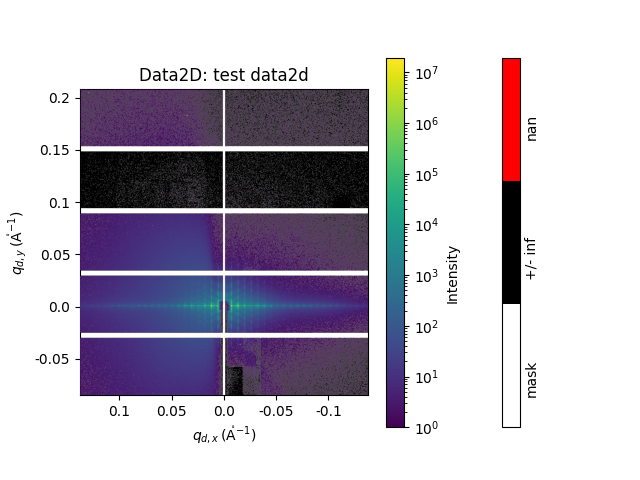

In [37]:
data.update_metadata(dict(center_px=(740, 490)))
fig = data.plot_data()

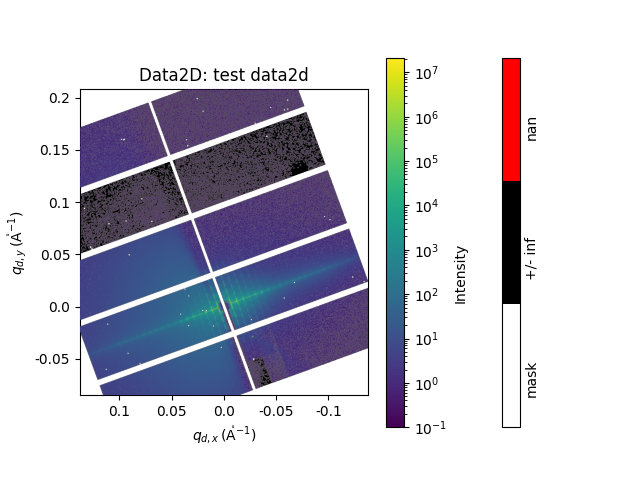

In [38]:
data.rotate_image(20) # the image can also be rotated about the beam center (if set) by a specified number of degrees
fig = data.plot_data()

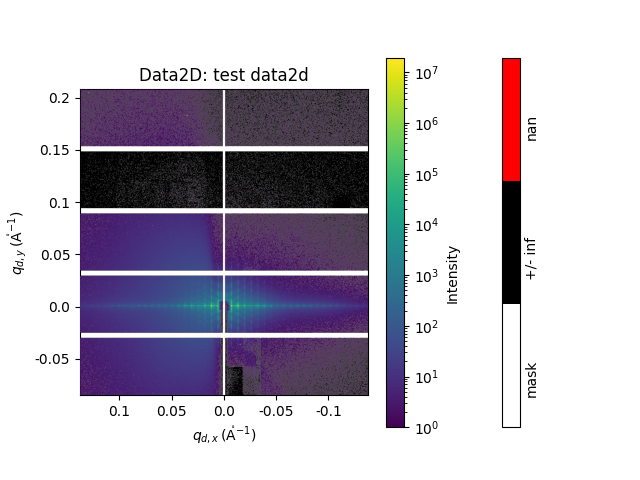

In [39]:
data.reset_image()
data.update_metadata(dict(center_px=(740, 490))) # make sure to reset the beam center after a reset image!
fig = data.plot_data()

In [40]:
box_limits_qdy, box_limits_qdx = data.get_box_dims_size( # get the index limits for an roi centered (or offset) on the beam center with the specified pixel size
    size_qdy_px = 20, # width of box vertically
    size_qdx_px = 500, # width of box horizontally
    shift_box_qdy_px=0, # shift the box vertically by this number of pixels
    shift_box_qdx_px=0, # shift the box horizontally by this number of pixels
)
box_limits_qdy, box_limits_qdx

((730, 750), (240, 740))

In [41]:
box_limits_qdy, box_limits_qdx = data.get_box_dims_qrange(
    range_qdy=(-0.01, 0.01),
    range_qdx=(0.1, -0.1))
box_limits_qdy, box_limits_qdx

((705, 776), (134, 847))

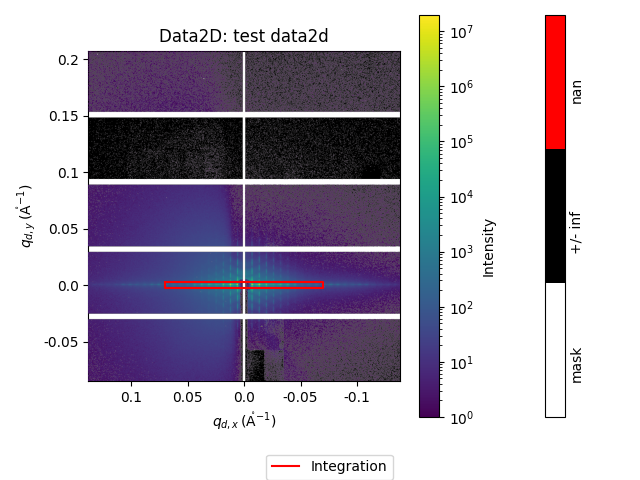

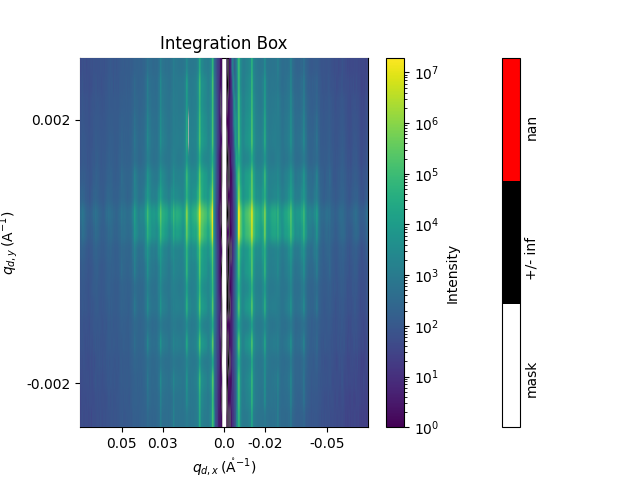

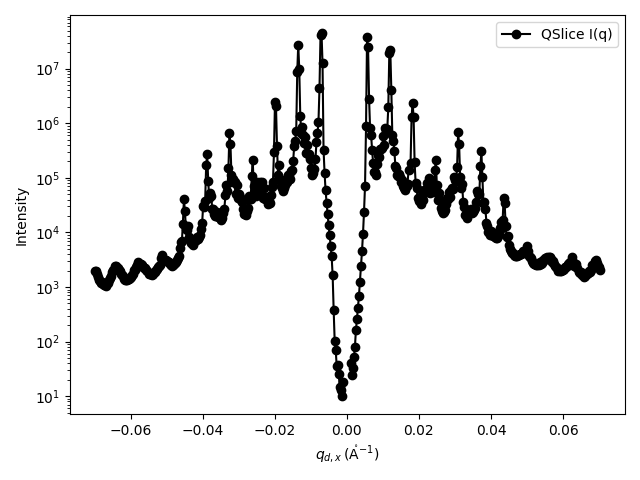

In [42]:
qslice, (fig, fig_box, fig_slice, fig_backgrounds) = data.integrate_box(
    limits_qdy_px=20, # you can also give this an index range like (730, 750) otherwise the box will be centered or offset from beam center
    limits_qdx_px=500, # you can also give this an index range like (240, 740) otherwise the box will be centered or offset from beam center
    mode='sum',
    axis=None, # other accepted inputs are 'qdy', 1, 'qdx' or 0; this is the axis that will be integrated across; if you leave it to None the function will assume to integrate across the shorter side of the integration box
    shift_box_qdy_px=0,
    shift_box_qdx_px=0,
    show_plot=True,
    subtract_background_offset=None, # change this to a single integer or list of integers to grab background ROIs for a subtraction
    plotting_kwargs={}, # any keyword arguments to matplotlib.pyplot.errorbar or to cdsaxs.plotting.plot_data2d_integrate_box can be passed using this dictionary
)


In [43]:
plt.close('all')

C:\Users\cmw5\Documents\github_repos\nist_cdsaxs\validation\../src\cdsaxs\data\data2d.py:860: RuntimeWarning:

Mean of empty slice



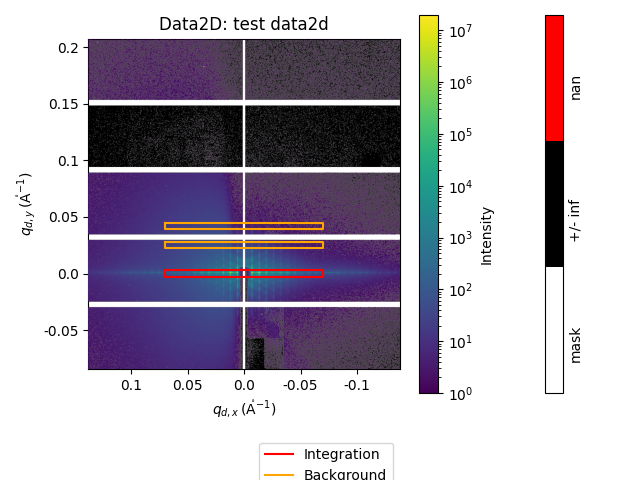

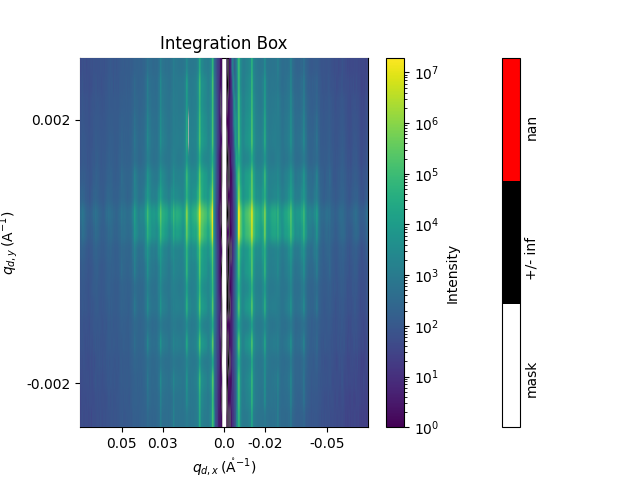

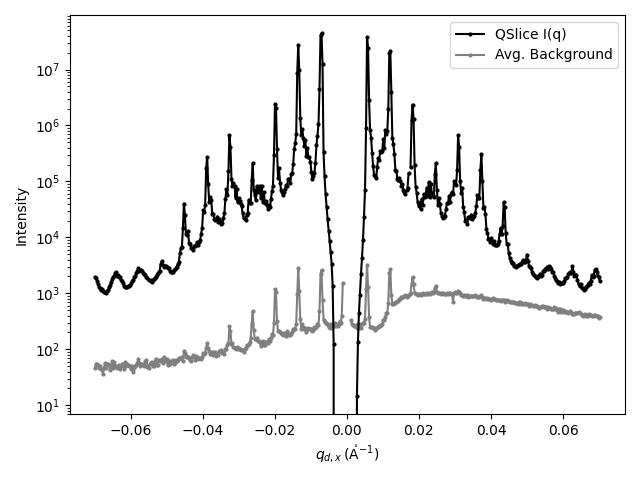

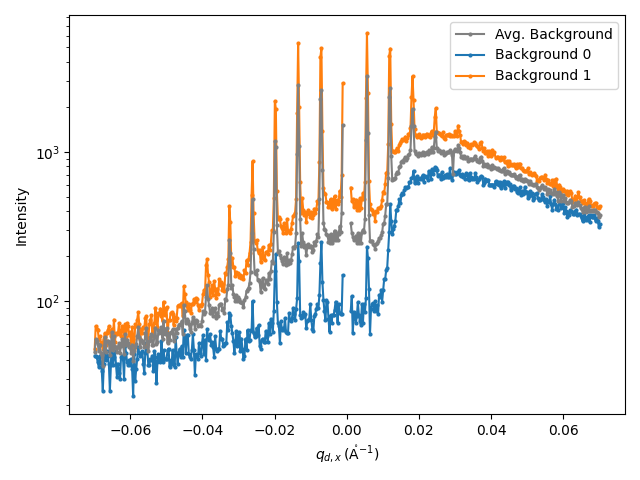

In [44]:
qslice, (fig, fig_box, fig_slice, fig_backgrounds) = data.integrate_box(
    limits_qdy_px=20, # you can also give this an index range like (730, 750) otherwise the box will be centered or offset from beam center
    limits_qdx_px=500, # you can also give this an index range like (240, 740) otherwise the box will be centered or offset from beam center
    mode='sum',
    axis=None, # other accepted inputs are 'qdy', 1, 'qdx' or 0; this is the axis that will be integrated across; if you leave it to None the function will assume to integrate across the shorter side of the integration box
    shift_box_qdy_px=0,
    shift_box_qdx_px=0,
    show_plot=True,
    subtract_background_offset=[-150, -90], # change this to a single integer or list of integers to grab background ROIs for a subtraction (the offset direction follows qdy or qdx axis)
    plotting_kwargs={
        'show_backgrounds': True,
        'show_legend': True,
        'color_avg_background': 'grey',
        'color_slice': 'black',
        'ms': 2,
    }, # any keyword arguments to matplotlib.pyplot.errorbar or to cdsaxs.plotting.plot_data2d_integrate_box can be passed using this dictionary
)

C:\Users\cmw5\Documents\github_repos\nist_cdsaxs\validation\../src\cdsaxs\tools.py:420: RuntimeWarning:

divide by zero encountered in log10

C:\Users\cmw5\Documents\github_repos\nist_cdsaxs\validation\../src\cdsaxs\tools.py:129: UserWarning:

Could not fit Gaussian to the peak location along axis 0;assuming peak is at the pixel with the highest value.

C:\Users\cmw5\Documents\github_repos\nist_cdsaxs\validation\../src\cdsaxs\tools.py:68: OptimizeWarning:

Covariance of the parameters could not be estimated

C:\Users\cmw5\Documents\github_repos\nist_cdsaxs\validation\../src\cdsaxs\tools.py:144: UserWarning:

Could not fit Gaussian to the peak location along axis 1;assuming peak is at the pixel with the highest value.



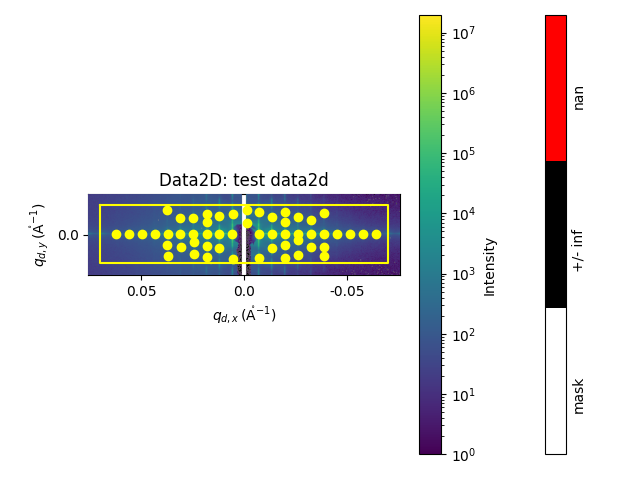

In [45]:
plt.close('all')
peaks, peaks_q, fig = data.find_peaks2D( # you can find 2D sets of peaks with this function
    limits_qdy_px=100, # or you can set an index range!
    limits_qdx_px=500,
    log_scale=True,
    refinement_size=7, # box around each peak sent to the Gaussian refinement function
    show_plot=True, 
    zoom_plot=True, # if set to True, the search box with a small border will be shown in the plot to more easily see the peaks found, otherwise if set to False they will all be overlaid on the original detector image
    plotting_kwargs={},
    min_distance=10, # see documentation for scikit-image peak_local_max() for all keyword arguments you can pass through
    threshold_abs=2, # if log_scale is set to True, the data is sent to the peak finding algorithm after taking log10 so make sure these values make sense for data after the transformation
)


C:\Users\cmw5\Documents\github_repos\nist_cdsaxs\validation\../src\cdsaxs\tools.py:68: OptimizeWarning:

Covariance of the parameters could not be estimated

C:\Users\cmw5\Documents\github_repos\nist_cdsaxs\validation\../src\cdsaxs\tools.py:345: UserWarning:

Could not fit Gaussian to the peak location;assuming peak is at the pixel with the highest value.

C:\Users\cmw5\Documents\github_repos\nist_cdsaxs\validation\../src\cdsaxs\tools.py:608: RuntimeWarning:

divide by zero encountered in log10

C:\Users\cmw5\Documents\github_repos\nist_cdsaxs\validation\../src\cdsaxs\tools.py:129: UserWarning:

Could not fit Gaussian to the peak location along axis 0;assuming peak is at the pixel with the highest value.



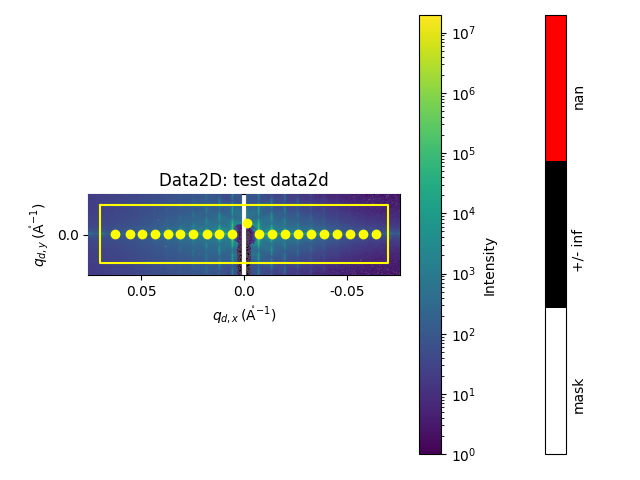

In [46]:
plt.close('all')
peaks, peaks_q, fig = data.find_peaks2D_one_axis( # you can find peaks in a 2D region of interest but this function limits only one peak in each row/column along the peak axis
    limits_qdy_px=100, # or you can set an index range!
    limits_qdx_px=500,
    peak_axis='qdx',
    integration_mode='sum',
    algorithm='scikit', # you can also switch to the legacy peak finder using 'scipy'
    log_scale=True,
    refinement_size=7, # box around each peak sent to the Gaussian refinement function
    show_plot=True, 
    zoom_plot=True, # if set to True, the search box with a small border will be shown in the plot to more easily see the peaks found, otherwise if set to False they will all be overlaid on the original detector image
    plotting_kwargs={},
    min_distance=10, # see documentation for scikit-image peak_local_max() for all keyword arguments you can pass through
    threshold_abs=2, # if log_scale is set to True, the data is sent to the peak finding algorithm after taking log10 so make sure these values make sense for data after the transformation
)

C:\Users\cmw5\Documents\github_repos\nist_cdsaxs\validation\../src\cdsaxs\tools.py:608: RuntimeWarning:

divide by zero encountered in log10



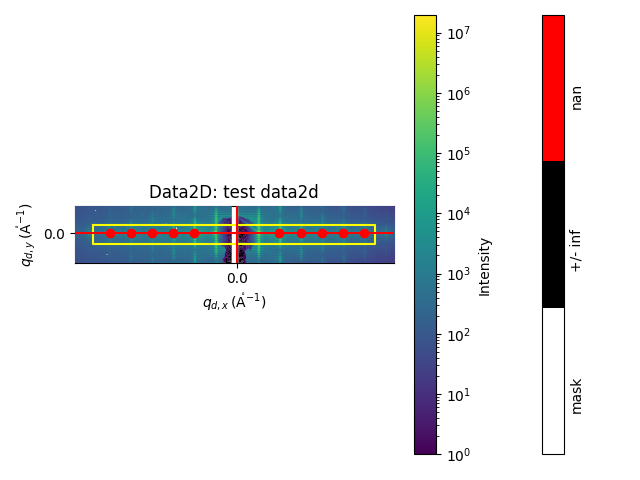

In [47]:
new_center, fig = data.find_beam_center_from_peaks( # make sure the peaks you find are symmetric around the beam stop 
    size_qdy_px=20,
    size_qdx_px=300,
    update=True, # whether to update the metadata for beam center, default is True
    beam_center_guess=None, # it will use the current beam center as the starting guess, which does need to be somewhat close as the function assumes peak orders on either side based on this guess; you can also give a new guess here on the fly
    show_plot=True,
    zoom_plot=True,
    ignore_peaks=[5, 6], # ignore some of the found peaks when determining beam center, in this case we will ignore the partially cut first order peaks (I am giving the keyword arguments the index that the peaks are in the list of all peaks, this might take some guessing at first)
    min_distance=10,
    plotting_kwargs={
        'color_integration_box': 'yellow',
        'color_peaks': 'red',
        'color_beam_center': 'red'}
)

C:\Users\cmw5\Documents\github_repos\nist_cdsaxs\validation\../src\cdsaxs\tools.py:608: RuntimeWarning:

divide by zero encountered in log10



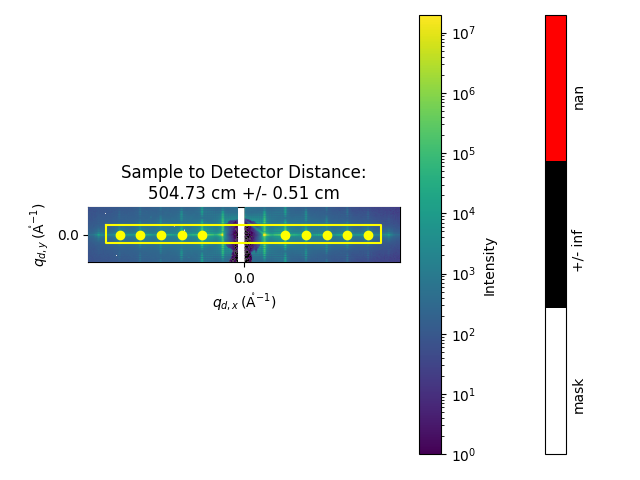

In [48]:
new_sdd_avg, new_sdd_std, fig = data.find_sdd_from_reference_peaks(
    pitch_nm = 100,
    size_qdy_px=20,
    size_qdx_px=300,
    update=True,
    show_plot=True,
    peak_orders=None,
    ignore_orders=[1, -1], # try commenting out this line to see the effects of a partially cutoff peak on the SDD!
    min_distance=10,
)

C:\Users\cmw5\Documents\github_repos\nist_cdsaxs\validation\../src\cdsaxs\tools.py:68: OptimizeWarning:

Covariance of the parameters could not be estimated

C:\Users\cmw5\Documents\github_repos\nist_cdsaxs\validation\../src\cdsaxs\tools.py:608: RuntimeWarning:

invalid value encountered in log10



-2.9742641295329437


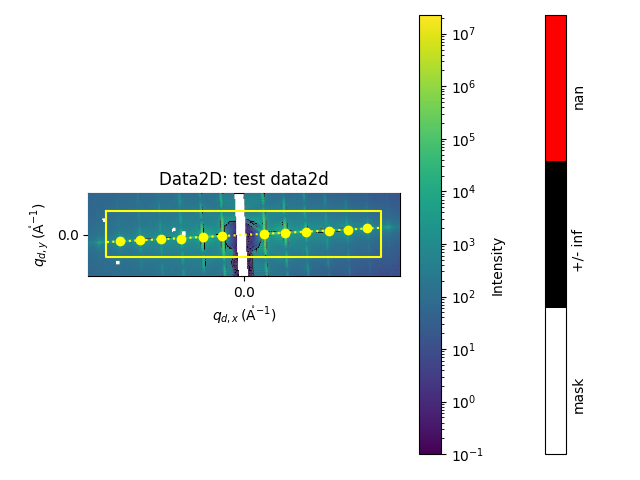

In [49]:
data.reset_image()
data.update_metadata(dict(center_px=new_center))
data.rotate_image(3) # offset the image to make sure the function is working properly
angle, fig = data.find_detector_rotation_correction( # angle  reference frame is a counterclockwise rotation about the POSITIVE z-axis (into the screen) so that this angle can be fed directly to the rotate_image method to correct the image
    size_qdy_px=50,
    size_qdx_px=300,
    show_plot=True,
    zoom_plot=True,
    min_distance=10)
print(angle)

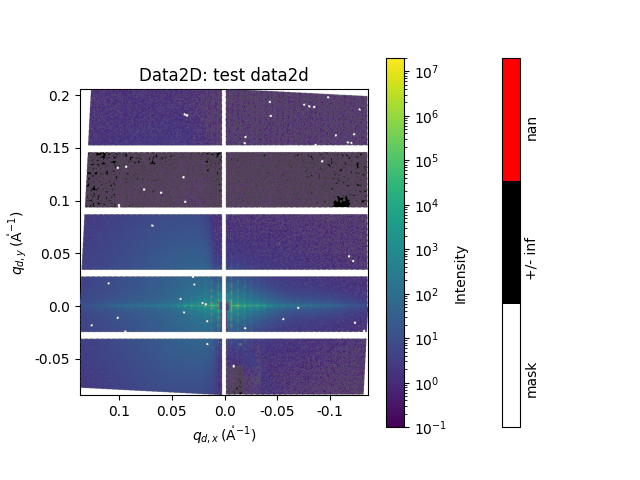

In [50]:
data.rotate_image(angle)
fig = data.plot_data()

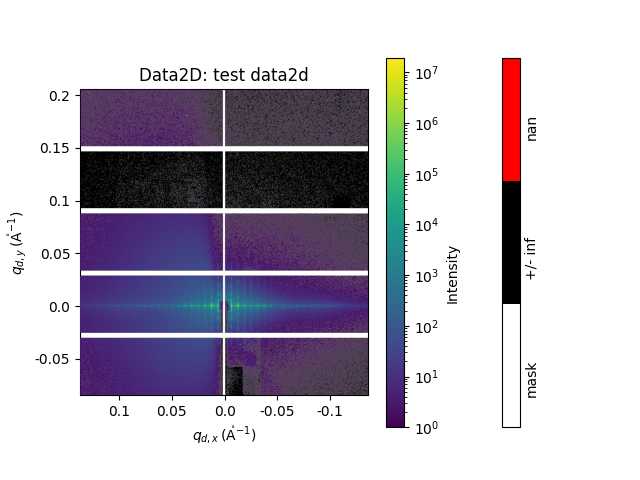

In [51]:
data.reset_image()
data.update_metadata(dict(center_px=new_center))
fig=data.plot_data()

## Dataset

In [52]:
dataset.datas # individual data instances are still stored in dataset.datas

{'W204 F2 at -60.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbea521d0>,
 'W204 F2 at -59.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbeaad9c0>,
 'W204 F2 at -58.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbea0d8d0>,
 'W204 F2 at -57.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbe5c3bb0>,
 'W204 F2 at -56.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbea3bd30>,
 'W204 F2 at -55.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbeade500>,
 'W204 F2 at -54.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbeac79a0>,
 'W204 F2 at -53.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbeaf7be0>,
 'W204 F2 at -52.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbe5d8310>,
 'W204 F2 at -51.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbe5d86a0>,
 'W204 F2 at 40.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbe5d97b0>,
 'W204 F2 at 41.0 deg': <cdsaxs.data.data2d.Data2D at 0x18d846a2f50>,
 'W204 F2 at 42.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbeac66e0>,
 'W204 F2 at 43.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbea39ff0>,
 'W204 F2 

In [53]:
dataset.name

'test_dataset'

In [54]:
dataset.__dict__ # dataset no longer includes integrated datasets or reduced datasets/slices!

{'datas': {'W204 F2 at -60.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbea521d0>,
  'W204 F2 at -59.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbeaad9c0>,
  'W204 F2 at -58.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbea0d8d0>,
  'W204 F2 at -57.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbe5c3bb0>,
  'W204 F2 at -56.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbea3bd30>,
  'W204 F2 at -55.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbeade500>,
  'W204 F2 at -54.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbeac79a0>,
  'W204 F2 at -53.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbeaf7be0>,
  'W204 F2 at -52.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbe5d8310>,
  'W204 F2 at -51.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbe5d86a0>,
  'W204 F2 at 40.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbe5d97b0>,
  'W204 F2 at 41.0 deg': <cdsaxs.data.data2d.Data2D at 0x18d846a2f50>,
  'W204 F2 at 42.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbeac66e0>,
  'W204 F2 at 43.0 deg': <cdsaxs.data.data2d.Data2D at 0x1

In [55]:
dataset.add_data(data) # you can add one or more Data2D instances to a dataset

In [56]:
dataset.datas

{'W204 F2 at -60.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbea521d0>,
 'W204 F2 at -59.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbeaad9c0>,
 'W204 F2 at -58.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbea0d8d0>,
 'W204 F2 at -57.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbe5c3bb0>,
 'W204 F2 at -56.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbea3bd30>,
 'W204 F2 at -55.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbeade500>,
 'W204 F2 at -54.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbeac79a0>,
 'W204 F2 at -53.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbeaf7be0>,
 'W204 F2 at -52.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbe5d8310>,
 'W204 F2 at -51.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbe5d86a0>,
 'W204 F2 at 40.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbe5d97b0>,
 'W204 F2 at 41.0 deg': <cdsaxs.data.data2d.Data2D at 0x18d846a2f50>,
 'W204 F2 at 42.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbeac66e0>,
 'W204 F2 at 43.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbea39ff0>,
 'W204 F2 

In [57]:
dataset.remove_data('test data2d') # you can remove it by either passing the data instance again or using the name

In [58]:
dataset.datas

{'W204 F2 at -60.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbea521d0>,
 'W204 F2 at -59.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbeaad9c0>,
 'W204 F2 at -58.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbea0d8d0>,
 'W204 F2 at -57.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbe5c3bb0>,
 'W204 F2 at -56.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbea3bd30>,
 'W204 F2 at -55.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbeade500>,
 'W204 F2 at -54.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbeac79a0>,
 'W204 F2 at -53.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbeaf7be0>,
 'W204 F2 at -52.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbe5d8310>,
 'W204 F2 at -51.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbe5d86a0>,
 'W204 F2 at 40.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbe5d97b0>,
 'W204 F2 at 41.0 deg': <cdsaxs.data.data2d.Data2D at 0x18d846a2f50>,
 'W204 F2 at 42.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbeac66e0>,
 'W204 F2 at 43.0 deg': <cdsaxs.data.data2d.Data2D at 0x18dbea39ff0>,
 'W204 F2 

In [59]:
one_data = dataset.datas['W204 F2 at -10.0 deg']
one_data.metadata

{'exposure_time_s': 2,
 'sdd_cm': 520.0,
 'energy_ev': 16100.000000000002,
 'wavelength_nm': 0.07700882268401862,
 'sample_phi_deg': -10.0,
 'pixel_size_um': 172,
 'data_directory': 'C:\\Users\\cmw5\\Documents\\github_repos\\nist_cdsaxs\\validation\\data_W204_F2',
 'filename': 'W204_F2measure1_5.2m_16.1keV_num50_-10deg_bpm0.421_id857171_combined.tif',
 'sample_phi_offset_deg': 0,
 'center_px': (0, 0)}

In [60]:
dataset.update_all_metadata(
    metadata=dict(center_px=new_center),
    overwrite=True,
    keys=None, # you can pass a list of keys if you only want to update some of the data
)
one_data.metadata

{'exposure_time_s': 2,
 'sdd_cm': 520.0,
 'energy_ev': 16100.000000000002,
 'wavelength_nm': 0.07700882268401862,
 'sample_phi_deg': -10.0,
 'pixel_size_um': 172,
 'data_directory': 'C:\\Users\\cmw5\\Documents\\github_repos\\nist_cdsaxs\\validation\\data_W204_F2',
 'filename': 'W204_F2measure1_5.2m_16.1keV_num50_-10deg_bpm0.421_id857171_combined.tif',
 'sample_phi_offset_deg': 0,
 'center_px': (738.34, 492.7)}

In [61]:
# new way to filter out keys by a single metadata parameter
keys = dataset.filter_data_by_metadata('sample_phi_deg', (-20, 20))
keys

['W204 F2 at -20.0 deg',
 'W204 F2 at -19.0 deg',
 'W204 F2 at -18.0 deg',
 'W204 F2 at -17.0 deg',
 'W204 F2 at -16.0 deg',
 'W204 F2 at -15.0 deg',
 'W204 F2 at -14.0 deg',
 'W204 F2 at -13.0 deg',
 'W204 F2 at -12.0 deg',
 'W204 F2 at -11.0 deg',
 'W204 F2 at -10.0 deg',
 'W204 F2 at -9.0 deg',
 'W204 F2 at -8.0 deg',
 'W204 F2 at -7.0 deg',
 'W204 F2 at -6.0 deg',
 'W204 F2 at -5.0 deg',
 'W204 F2 at -4.0 deg',
 'W204 F2 at -3.0 deg',
 'W204 F2 at -2.0 deg',
 'W204 F2 at -1.0 deg',
 'W204 F2 at 0.0 deg',
 'W204 F2 at 1.0 deg',
 'W204 F2 at 2.0 deg',
 'W204 F2 at 3.0 deg',
 'W204 F2 at 4.0 deg',
 'W204 F2 at 5.0 deg',
 'W204 F2 at 6.0 deg',
 'W204 F2 at 7.0 deg',
 'W204 F2 at 8.0 deg',
 'W204 F2 at 9.0 deg',
 'W204 F2 at 10.0 deg',
 'W204 F2 at 11.0 deg',
 'W204 F2 at 12.0 deg',
 'W204 F2 at 13.0 deg',
 'W204 F2 at 14.0 deg',
 'W204 F2 at 15.0 deg',
 'W204 F2 at 16.0 deg',
 'W204 F2 at 17.0 deg',
 'W204 F2 at 18.0 deg',
 'W204 F2 at 19.0 deg',
 'W204 F2 at 20.0 deg']

In [62]:
keys = dataset.filter_data_by_metadata('sample_phi_deg', [10, 0])
keys

['W204 F2 at 0.0 deg', 'W204 F2 at 10.0 deg']

In [63]:
keys = dataset.filter_data_by_metadata('sample_phi_deg', 0)
keys

['W204 F2 at 0.0 deg']

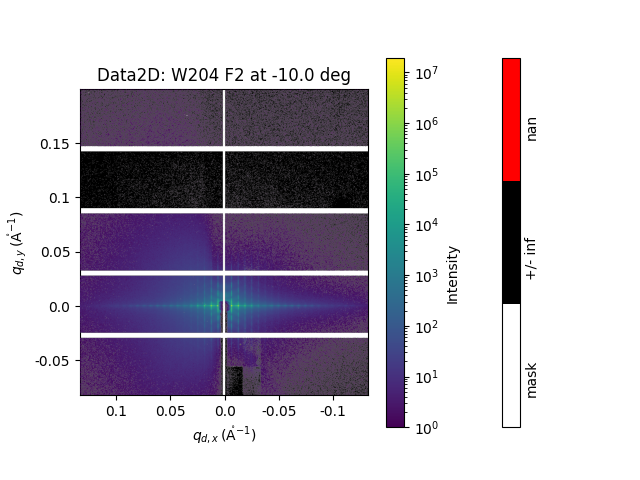

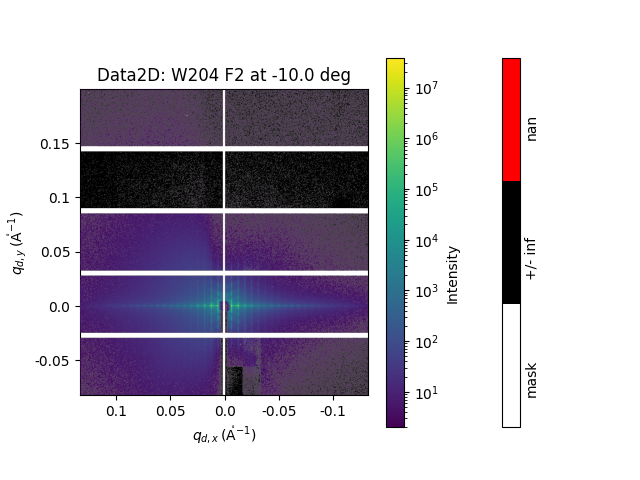

In [64]:
# you can normalize, add, subtract, scale, rotate counterclockwise, and reset all images or just intensities across the whole dataset or a subset of the dataset by giving a list of filtered data keys
fig = one_data.plot_data()
dataset.scale_all_data(2)
fig = one_data.plot_data()

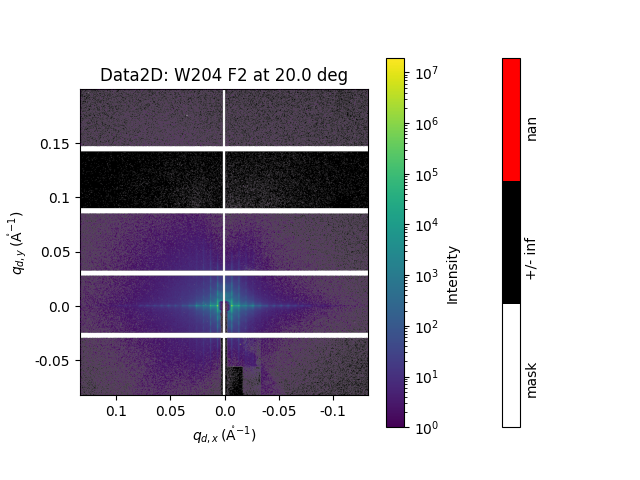

In [381]:
dataset.reset_all_data_intensity()
fig = one_data.plot_data()

In [66]:
integrated_dataset = dataset.integrate_dataset(
    limits_qdy_px=10,
    limits_qdx_px=500,
    mode='sum',
    axis=0)

## Integrated Dataset & QSlice
The integrated dataset class is really a container for many QSlice instances created by integrated a dataset.

In [67]:
integrated_dataset.__dict__

{'name': None,
 'qslices': [<cdsaxs.data.qslice.QSlice at 0x18ebb65ba60>,
  <cdsaxs.data.qslice.QSlice at 0x18ebb699180>]}

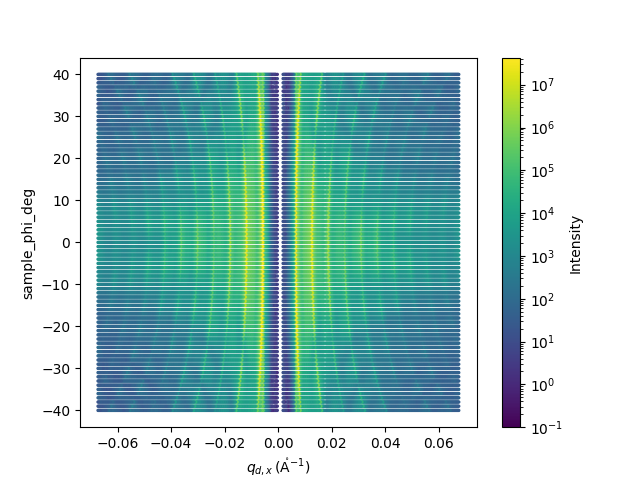

In [309]:
fig = integrated_dataset.plot_data(
    q_axis='qdx',
    y_axis='sample_phi_deg',
    log_scale=True,
    cmap='viridis',
    vmin=None,
    vmax=None,
    filter_by_q={},
    filter_by_metadata={'sample_phi_deg': (-40, 40)},
    s=2
)

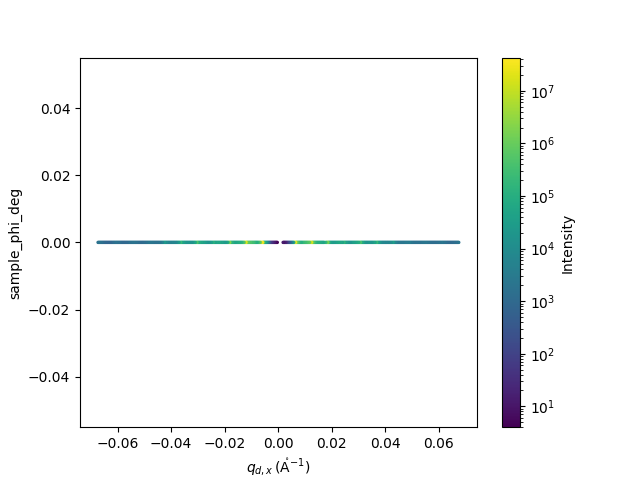

In [310]:
fig = integrated_dataset.plot_data(
    q_axis='qdx',
    y_axis='sample_phi_deg',
    log_scale=True,
    cmap='viridis',
    vmin=None,
    vmax=None,
    filter_by_q={},
    filter_by_metadata={'sample_phi_deg': 0},
    s=2
)

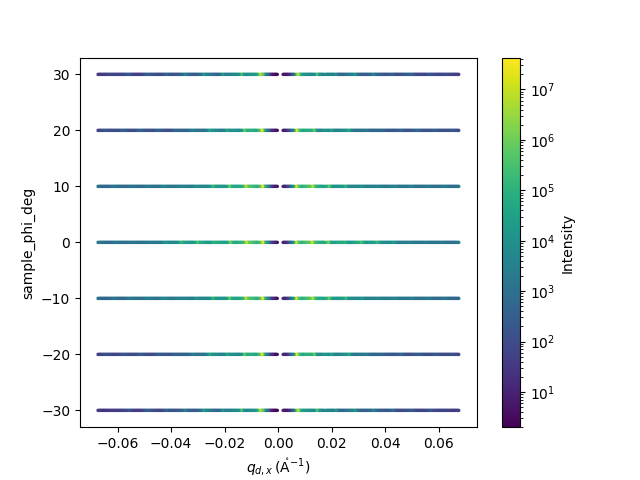

In [312]:
fig = integrated_dataset.plot_data(
    q_axis='qdx',
    y_axis='sample_phi_deg',
    log_scale=True,
    cmap='viridis',
    vmin=None,
    vmax=None,
    filter_by_q={},
    filter_by_metadata={'sample_phi_deg': [0, 10, -10, 20, -20, 30, -30]},
    s=2
)

## Reduced Dataset and ReducedData1D

In [351]:
reduced_dataset = cdsaxs.reduction.reduce_dataset(integrated_dataset)

In [352]:
reduced_dataset.data

In [353]:
reduced_data1d = reduced_dataset.data[0]

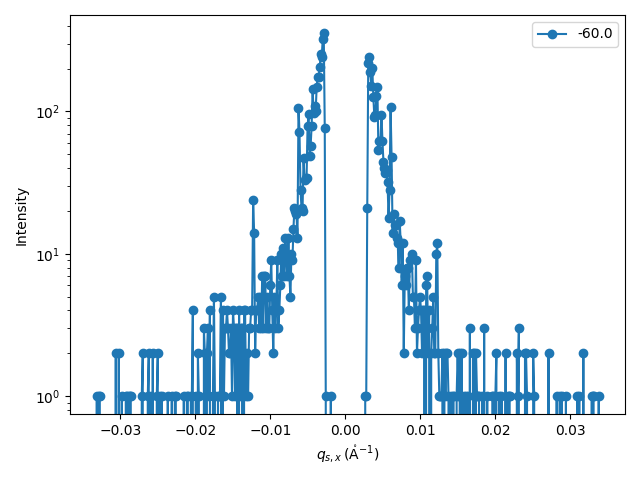

In [358]:
fig = reduced_data1d.plot_data(
    q_axis=None,
    log_scale=True,
    show_legend=True,
    xlim=None,
    ylim=None,
    fmt='o-',
    label=reduced_data1d.sample_phi_deg # you can pass any keyword arguments for matplotlib.errorbar in as keyword arguments to this function
)

## Reduced Slices and ReducedData1DSlice

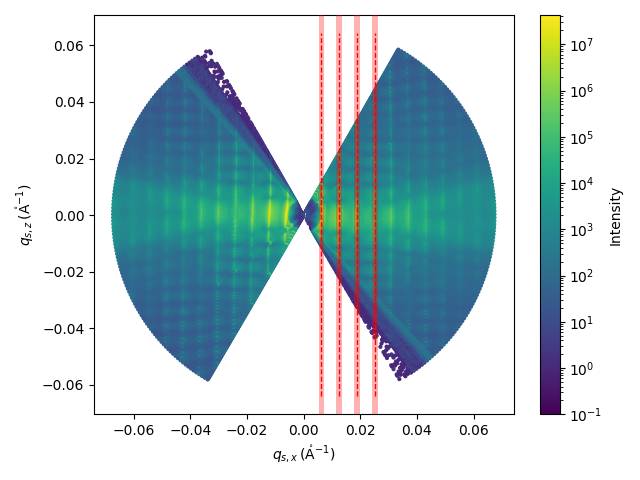

In [370]:
q_values = np.arange(1, 5)*2*np.pi/1000
reduced_slices, fig = cdsaxs.reduction.slice_reduced_dataset(reduced_dataset, q_values=q_values, q_widths=0.002, plotting_kwargs=dict(interpolated_data=False, s=4, slice_lw=1))

In [371]:
reduced_slices.data

In [379]:
reduced_slice = reduced_slices.data[3]

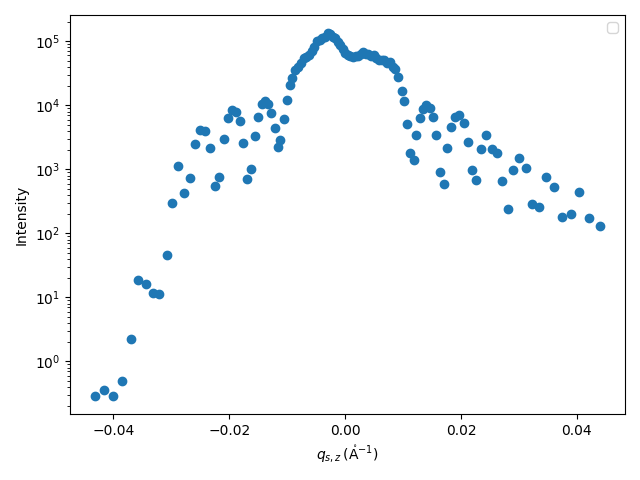

In [380]:
fig = reduced_slice.plot_data(fmt='o')

In [366]:
reduced_slice.Iq

array([3.06666667e+00, 3.00000000e+00, 3.23076923e+00, 5.28571429e+00,
       2.85384615e+01, 1.25615385e+02, 9.93333333e+01, 1.11083333e+02,
       1.74416667e+02, 6.44666667e+02, 3.62745000e+04, 5.46325000e+03,
       3.35493636e+04, 2.31056667e+04, 1.56289167e+04, 9.63333333e+03,
       5.47500000e+03, 3.38576923e+03, 4.39038462e+03, 8.12223077e+03,
       1.28655714e+04, 1.67897333e+04, 4.22025455e+04, 1.68640667e+04,
       5.43273333e+04, 8.19974000e+04, 1.17103100e+05, 1.69872444e+05,
       2.00847333e+05, 2.23559333e+05, 2.29694222e+05, 2.22394000e+05,
       2.30799875e+05, 1.75934333e+05, 1.52413375e+05, 9.48683333e+04,
       6.11157500e+04, 2.58477778e+04, 1.29180000e+04, 2.17966250e+04,
       6.36772500e+04, 1.40669125e+05, 2.55462750e+05, 4.22367125e+05,
       6.23396500e+05, 8.71827125e+05, 1.31415929e+06, 1.48562338e+06,
       1.82692150e+06, 2.18817050e+06, 2.87639700e+06, 3.32532329e+06,
       3.37661688e+06, 3.68028688e+06, 4.00829350e+06, 4.31977562e+06,
      

In [367]:
reduced_slice.qsz

array([-2.50762794e-07,  1.62562604e-06,  3.50151969e-06,  5.37634675e-06,
        7.24953612e-06,  9.12051721e-06,  1.09887201e-05,  1.28535757e-05,
        1.47145160e-05,  1.65709741e-05,  1.01736641e-04,  1.84223846e-05,
        1.01114404e-04,  1.00461366e-04,  9.97777275e-05,  9.90636953e-05,
        9.83194873e-05,  9.75453303e-05,  9.67414600e-05,  9.59081213e-05,
        9.50455681e-05,  9.41540631e-05,  2.02681834e-05,  9.32338778e-05,
        3.82949022e-05,  4.00423623e-05,  4.17776251e-05,  4.35001620e-05,
        4.52094484e-05,  4.69049635e-05,  4.85861910e-05,  5.02526186e-05,
        5.19037387e-05,  5.35390485e-05,  5.51580498e-05,  5.67602494e-05,
        5.83451593e-05,  5.99122966e-05,  6.14611841e-05,  6.29913500e-05,
        6.45023280e-05,  6.59936581e-05,  6.74648858e-05,  6.89155630e-05,
        7.03452480e-05,  7.17535050e-05,  7.31399053e-05,  7.45040264e-05,
        7.58454529e-05,  7.71637761e-05,  7.84585945e-05,  7.97295137e-05,
        8.09761464e-05,  

In [369]:
importlib.reload(cdsaxs)
importlib.reload(cdsaxs.plotting.plotting)
importlib.reload(cdsaxs.plotting._plotting_tools)
importlib.reload(cdsaxs.data.dataset)
importlib.reload(cdsaxs.reduction)
importlib.reload(cdsaxs.data)
importlib.reload(cdsaxs.data.data1d)
importlib.reload(cdsaxs.data.reduced_data1d)

<module 'cdsaxs.data.reduced_data1d' from 'C:\\Users\\cmw5\\Documents\\github_repos\\nist_cdsaxs\\validation\\../src\\cdsaxs\\data\\reduced_data1d.py'>

In [266]:
reduced_dataset = cdsaxs.reduction.reduce_dataset(integrated_dataset)

0.1 42920517.0


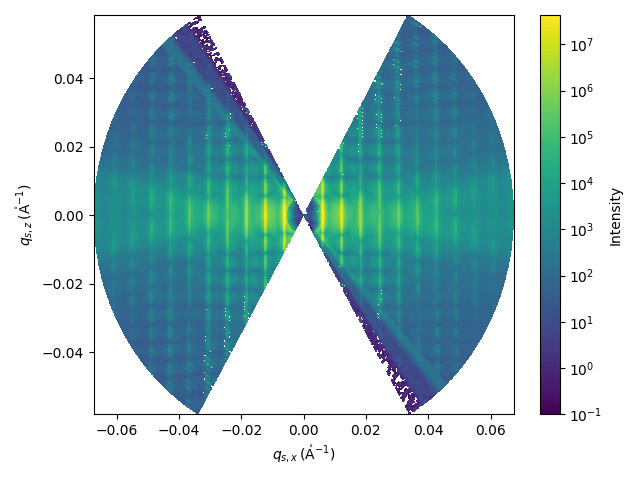

In [287]:
import cdsaxs.plotting.plotting
fig = cdsaxs.plotting.plotting.plot_reduced_dataset(reduced_dataset, interpolated_data=True)

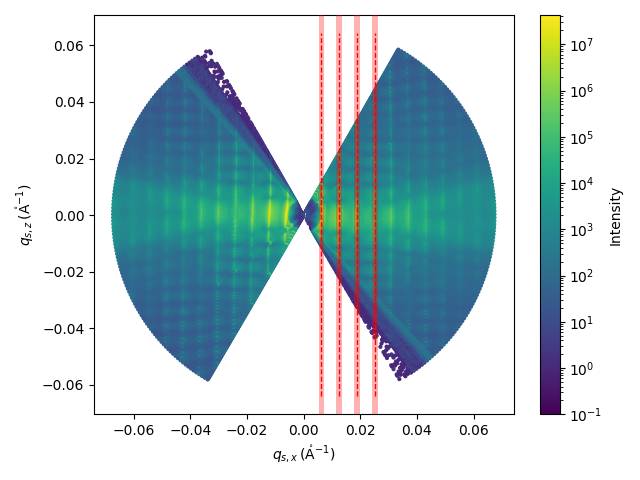

In [304]:
q_values = np.arange(1, 5)*2*np.pi/1000
reduced_slices, fig = cdsaxs.reduction.slice_reduced_dataset(reduced_dataset, q_values=q_values, q_widths=0.002, plotting_kwargs=dict(interpolated_data=False, s=4, slice_lw=1))

In [395]:
importlib.reload(cdsaxs)
importlib.reload(cdsaxs.plotting.plotting)
importlib.reload(cdsaxs.plotting._plotting_tools)
importlib.reload(cdsaxs.data.dataset)
importlib.reload(cdsaxs.reduction)
importlib.reload(cdsaxs.data)
importlib.reload(cdsaxs.data.data1d)
importlib.reload(cdsaxs.data.reduced_data1d)

<module 'cdsaxs.data.reduced_data1d' from 'C:\\Users\\cmw5\\Documents\\github_repos\\nist_cdsaxs\\validation\\../src\\cdsaxs\\data\\reduced_data1d.py'>

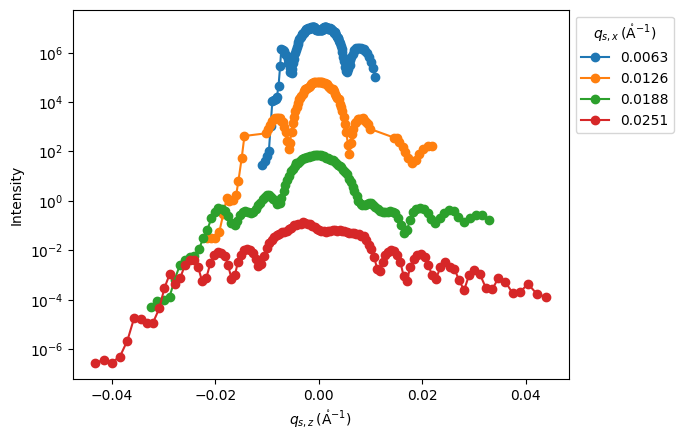

In [398]:
cdsaxs.plotting.plotting.plot_reduced_slices(reduced_slices, offset_order=2)